In [3]:
from google.colab import drive
drive.mount('/content/drive')

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


In [4]:
!pip install -q segmentation-models-pytorch
!pip install -q albumentations
!pip install -q timm

In [5]:
import os
import cv2
import torch
import random
import numpy as np
import pandas as pd

from PIL import Image
from tqdm import tqdm
from glob import glob

import matplotlib.pyplot as plt

from sklearn.model_selection import train_test_split

import albumentations as A

import torch.nn as nn
from torch.utils.data import Dataset, DataLoader

import segmentation_models_pytorch as smp

In [ ]:
ROOT = "/content/drive/MyDrive/GLOC"

LABEL_ROOT = os.path.join(
    ROOT,
    "Label_Subset",
    "Class_Labels"
)

MASK_ROOT = os.path.join(
    ROOT,
    "Label_Subset",
    "Ground truth"
)

CHECKPOINT_DIR = os.path.join(ROOT, "checkpoints")
OUTPUT_DIR = os.path.join(ROOT, "outputs")

os.makedirs(CHECKPOINT_DIR, exist_ok=True)
os.makedirs(OUTPUT_DIR, exist_ok=True)

In [ ]:
classes = [
    "Cloud Cover",
    "Debris Cover",
    "Moraine",
    "Snow Cover",
    "Terraine Shadow",
    "Turbidity"
]

images = []
masks = []

for cls in classes:

    img_dir = os.path.join(LABEL_ROOT, cls)
    mask_dir = os.path.join(MASK_ROOT, cls)

    for file in os.listdir(img_dir):

        img_path = os.path.join(img_dir, file)
        mask_path = os.path.join(mask_dir, file)

        if os.path.exists(mask_path):

            images.append(img_path)
            masks.append(mask_path)

print("Images:", len(images))
print("Masks :", len(masks))

Images: 60
Masks : 60


In [ ]:
for cls in classes:
    print(cls)
    print("Images:", len(os.listdir(os.path.join(LABEL_ROOT, cls))))
    print("Masks :", len(os.listdir(os.path.join(MASK_ROOT, cls))))
    print()

Cloud Cover
Images: 10
Masks : 10

Debris Cover
Images: 10
Masks : 10

Moraine
Images: 10
Masks : 10

Snow Cover
Images: 10
Masks : 10

Terraine Shadow
Images: 10
Masks : 10

Turbidity
Images: 10
Masks : 10



In [ ]:
train_imgs, val_imgs, train_masks, val_masks = train_test_split(
    images,
    masks,
    test_size=0.2,
    random_state=42
)

print(len(train_imgs))
print(len(val_imgs))

48
12


In [ ]:
train_transform = A.Compose([
    A.HorizontalFlip(p=0.5),
    A.VerticalFlip(p=0.5),
    A.RandomRotate90(p=0.5),
    A.RandomBrightnessContrast(p=0.3)
])

val_transform = A.Compose([])

In [ ]:
class LakeDataset(Dataset):

    def __init__(self, images, masks, transform=None):

        self.images = images
        self.masks = masks
        self.transform = transform

    def __len__(self):
        return len(self.images)

    def __getitem__(self, idx):

        image = cv2.imread(self.images[idx])
        image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)

        mask = cv2.imread(
            self.masks[idx],
            cv2.IMREAD_GRAYSCALE
        )

        mask = (mask > 0).astype(np.float32)

        if self.transform:

            transformed = self.transform(
                image=image,
                mask=mask
            )

            image = transformed["image"]
            mask = transformed["mask"]

        image = image.astype(np.float32) / 255.0

        image = np.transpose(image, (2,0,1))

        return (
            torch.tensor(image, dtype=torch.float32),
            torch.tensor(mask, dtype=torch.float32).unsqueeze(0)
        )

In [ ]:
train_ds = LakeDataset(
    train_imgs,
    train_masks,
    train_transform
)

val_ds = LakeDataset(
    val_imgs,
    val_masks,
    val_transform
)

train_loader = DataLoader(
    train_ds,
    batch_size=4,
    shuffle=True
)

val_loader = DataLoader(
    val_ds,
    batch_size=4,
    shuffle=False
)

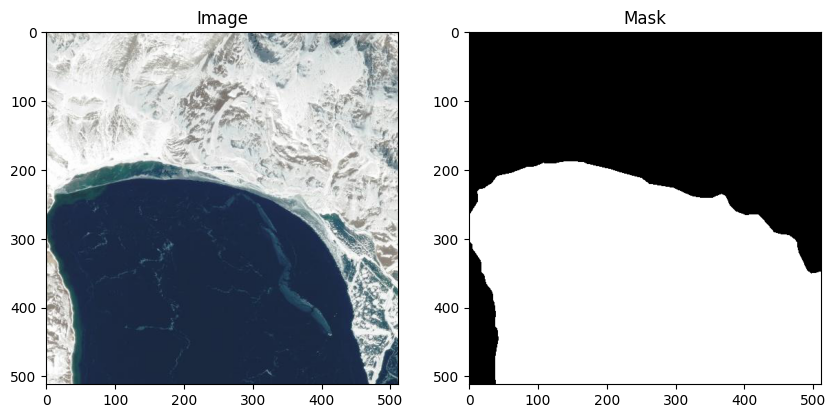

In [ ]:
img, mask = train_ds[0]

plt.figure(figsize=(10,5))

plt.subplot(1,2,1)
plt.imshow(img.permute(1,2,0))
plt.title("Image")

plt.subplot(1,2,2)
plt.imshow(mask.squeeze(), cmap="gray")
plt.title("Mask")

plt.show()

In [ ]:
device = torch.device(
    "cuda" if torch.cuda.is_available()
    else "cpu"
)

print(device)

cuda


In [ ]:
model = smp.Unet(
    encoder_name="resnet34",
    encoder_weights="imagenet",
    in_channels=3,
    classes=1
)

model = model.to(device)

/usr/local/lib/python3.12/dist-packages/huggingface_hub/utils/_auth.py:112: UserWarning: 
The secret `HF_TOKEN` does not exist in your Colab secrets.
To authenticate with the Hugging Face Hub, create a token in your settings tab (https://huggingface.co/settings/tokens), set it as secret in your Google Colab and restart your session.
You will be able to reuse this secret in all of your notebooks.
Please note that authentication is recommended but still optional to access public models or datasets.
  warnings.warn(


config.json:   0%|          | 0.00/156 [00:00<?, ?B/s]

model.safetensors:   0%|          | 0.00/87.3M [00:00<?, ?B/s]

In [ ]:
bce = nn.BCEWithLogitsLoss()

def dice_loss(pred, target):

    pred = torch.sigmoid(pred)

    smooth = 1e-6

    intersection = (pred * target).sum()

    union = pred.sum() + target.sum()

    dice = (
        2 * intersection + smooth
    ) / (
        union + smooth
    )

    return 1 - dice

def loss_fn(pred, target):
    return bce(pred,target) + dice_loss(pred,target)

In [ ]:
optimizer = torch.optim.Adam(
    model.parameters(),
    lr=1e-4
)

In [ ]:
best_loss = 999

EPOCHS = 40

for epoch in range(EPOCHS):

    model.train()

    train_loss = 0

    for images, masks in train_loader:

        images = images.to(device)
        masks = masks.to(device)

        optimizer.zero_grad()

        outputs = model(images)

        loss = loss_fn(
            outputs,
            masks
        )

        loss.backward()
        optimizer.step()

        train_loss += loss.item()

    train_loss /= len(train_loader)

    model.eval()

    val_loss = 0

    with torch.no_grad():

        for images, masks in val_loader:

            images = images.to(device)
            masks = masks.to(device)

            outputs = model(images)

            loss = loss_fn(
                outputs,
                masks
            )

            val_loss += loss.item()

    val_loss /= len(val_loader)

    print(
        f"Epoch {epoch+1} | "
        f"Train {train_loss:.4f} | "
        f"Val {val_loss:.4f}"
    )

    if val_loss < best_loss:

        best_loss = val_loss

        torch.save(
            model.state_dict(),
            os.path.join(
                CHECKPOINT_DIR,
                "best_unet.pth"
            )
        )

        print("saved")

Epoch 1 | Train 1.5761 | Val 1.5062
saved
Epoch 2 | Train 1.4659 | Val 1.5541
Epoch 3 | Train 1.3889 | Val 1.4488
saved
Epoch 4 | Train 1.3414 | Val 1.4664
Epoch 5 | Train 1.2862 | Val 1.3301
saved
Epoch 6 | Train 1.2443 | Val 1.3300
saved
Epoch 7 | Train 1.2146 | Val 1.3225
saved
Epoch 8 | Train 1.1700 | Val 1.2289
saved
Epoch 9 | Train 1.1528 | Val 1.2137
saved
Epoch 10 | Train 1.1034 | Val 1.1542
saved
Epoch 11 | Train 1.1037 | Val 1.1281
saved
Epoch 12 | Train 1.0532 | Val 1.1540
Epoch 13 | Train 1.0300 | Val 1.1022
saved
Epoch 14 | Train 0.9900 | Val 1.1229
Epoch 15 | Train 0.9828 | Val 1.1069
Epoch 16 | Train 0.9310 | Val 1.0544
saved
Epoch 17 | Train 0.9092 | Val 1.0462
saved
Epoch 18 | Train 0.9122 | Val 1.0256
saved
Epoch 19 | Train 0.8661 | Val 1.0088
saved
Epoch 20 | Train 0.8660 | Val 0.9868
saved
Epoch 21 | Train 0.8550 | Val 0.9606
saved
Epoch 22 | Train 0.8065 | Val 0.9458
saved
Epoch 23 | Train 0.7944 | Val 0.9676
Epoch 24 | Train 0.8110 | Val 0.9559
Epoch 25 | Train 0.

In [ ]:
model.load_state_dict(
    torch.load(
        os.path.join(
            CHECKPOINT_DIR,
            "best_unet.pth"
        )
    )
)

<All keys matched successfully>

In [ ]:
def predict(image_path):

    image = cv2.imread(image_path)

    image = cv2.cvtColor(
        image,
        cv2.COLOR_BGR2RGB
    )

    inp = image.astype(np.float32)/255.0

    inp = np.transpose(inp,(2,0,1))

    inp = torch.tensor(
        inp,
        dtype=torch.float32
    ).unsqueeze(0)

    inp = inp.to(device)

    model.eval()

    with torch.no_grad():

        pred = model(inp)

        pred = torch.sigmoid(pred)

        pred = pred.squeeze().cpu().numpy()

    return image,pred

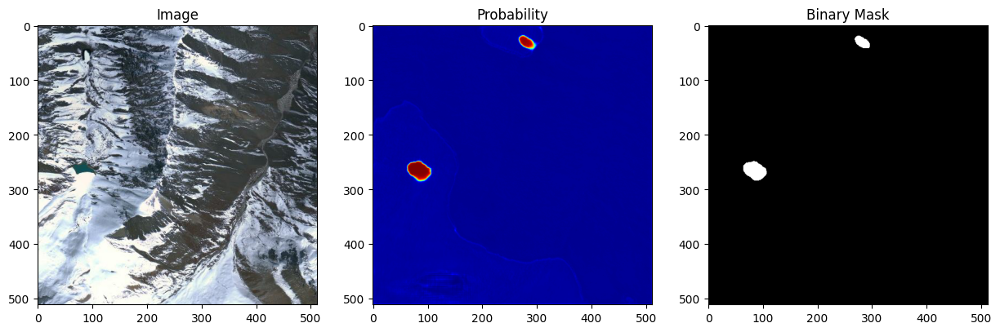

In [ ]:
image,pred = predict(val_imgs[11])

mask = (pred > 0.5).astype(np.uint8)

plt.figure(figsize=(15,5))

plt.subplot(1,3,1)
plt.imshow(image)
plt.title("Image")

plt.subplot(1,3,2)
plt.imshow(pred,cmap="jet")
plt.title("Probability")

plt.subplot(1,3,3)
plt.imshow(mask,cmap="gray")
plt.title("Binary Mask")

plt.show()

In [ ]:
import numpy as np
import torch

def dice_score(pred, target):

    pred = (pred > 0.5).float()

    intersection = (pred * target).sum()

    return (
        2 * intersection + 1e-6
    ) / (
        pred.sum() + target.sum() + 1e-6
    )

def iou_score(pred, target):

    pred = (pred > 0.5).float()

    intersection = (pred * target).sum()

    union = (
        pred + target
    ).clamp(0,1).sum()

    return (
        intersection + 1e-6
    ) / (
        union + 1e-6
    )

model.eval()

dice_list = []
iou_list = []

with torch.no_grad():

    for images, masks in val_loader:

        images = images.to(device)
        masks = masks.to(device)

        outputs = model(images)

        outputs = torch.sigmoid(outputs)

        dice_list.append(
            dice_score(outputs,masks).item()
        )

        iou_list.append(
            iou_score(outputs,masks).item()
        )

print("Mean Dice:", np.mean(dice_list))
print("Mean IoU :", np.mean(iou_list))

Mean Dice: 0.6314855317274729
Mean IoU : 0.5093394170204798


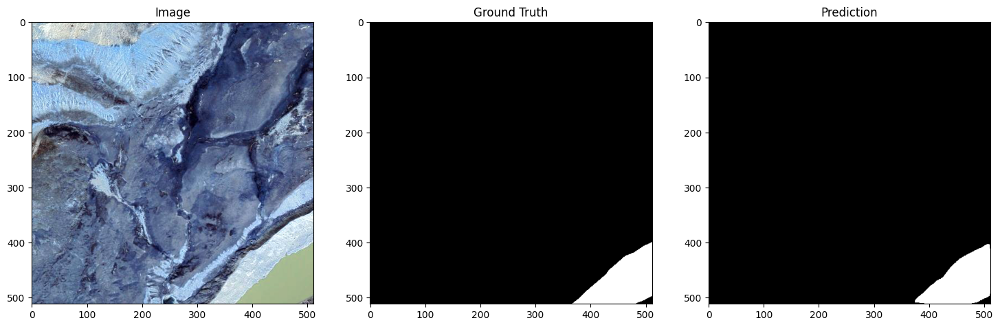

In [ ]:
idx = 5

image = cv2.imread(val_imgs[idx])
image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)

gt = cv2.imread(
    val_masks[idx],
    cv2.IMREAD_GRAYSCALE
)

_, pred = predict(val_imgs[idx])

pred_bin = (pred > 0.5).astype(np.uint8)

plt.figure(figsize=(18,6))

plt.subplot(1,3,1)
plt.imshow(image)
plt.title("Image")

plt.subplot(1,3,2)
plt.imshow(gt, cmap="gray")
plt.title("Ground Truth")

plt.subplot(1,3,3)
plt.imshow(pred_bin, cmap="gray")
plt.title("Prediction")

plt.show()

In [ ]:
import os

UNLABELED_ROOT = "/content/drive/MyDrive/GLOC/SNUC GLOFeagles 2026 challenge datasets"

PSEUDO_DIR = "/content/drive/MyDrive/GLOC/pseudo_labels"

os.makedirs(PSEUDO_DIR, exist_ok=True)

print("Ready")

Ready


In [ ]:
all_imgs = []

for f in os.listdir(UNLABELED_ROOT):

    if f.lower().endswith(".png"):
        all_imgs.append(
            os.path.join(UNLABELED_ROOT, f)
        )

print("Unlabeled images:", len(all_imgs))
print(all_imgs[:5])

Unlabeled images: 575
['/content/drive/MyDrive/GLOC/SNUC GLOFeagles 2026 challenge datasets/165.png', '/content/drive/MyDrive/GLOC/SNUC GLOFeagles 2026 challenge datasets/158.png', '/content/drive/MyDrive/GLOC/SNUC GLOFeagles 2026 challenge datasets/168.png', '/content/drive/MyDrive/GLOC/SNUC GLOFeagles 2026 challenge datasets/161.png', '/content/drive/MyDrive/GLOC/SNUC GLOFeagles 2026 challenge datasets/167.png']


In [ ]:
def predict_mask(image_path):

    image = cv2.imread(image_path)
    image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)

    inp = image.astype(np.float32)/255.0
    inp = np.transpose(inp,(2,0,1))

    inp = torch.tensor(
        inp,
        dtype=torch.float32
    ).unsqueeze(0)

    inp = inp.to(device)

    model.eval()

    with torch.no_grad():

        pred = model(inp)

        pred = torch.sigmoid(pred)

        pred = pred.squeeze().cpu().numpy()

    return pred

In [ ]:
accepted = 0

for img_path in tqdm(all_imgs):

    pred = predict_mask(img_path)

    binary = (pred > 0.5).astype(np.uint8)

    area = binary.sum()

    max_prob = pred.max()

    if area < 20:
        continue

    if max_prob < 0.8:
        continue

    save_name = os.path.basename(img_path)

    cv2.imwrite(
        os.path.join(
            PSEUDO_DIR,
            save_name
        ),
        binary * 255
    )

    accepted += 1

print("Accepted:", accepted)

100%|██████████| 575/575 [00:55<00:00, 10.44it/s]

Accepted: 499


In [ ]:
pseudo_files = os.listdir(PSEUDO_DIR)

print("Pseudo labels:", len(pseudo_files))

Pseudo labels: 499


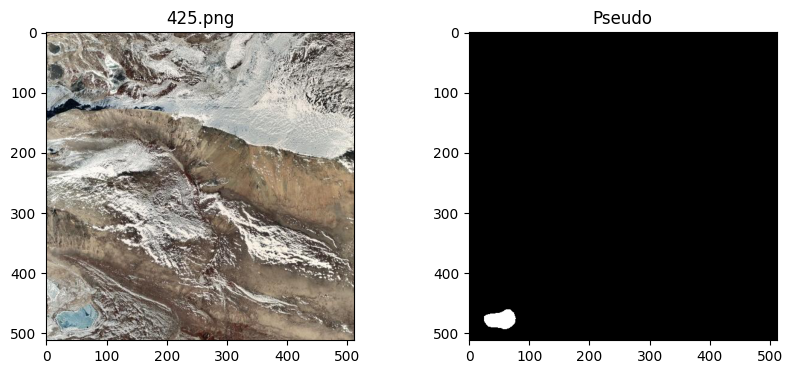

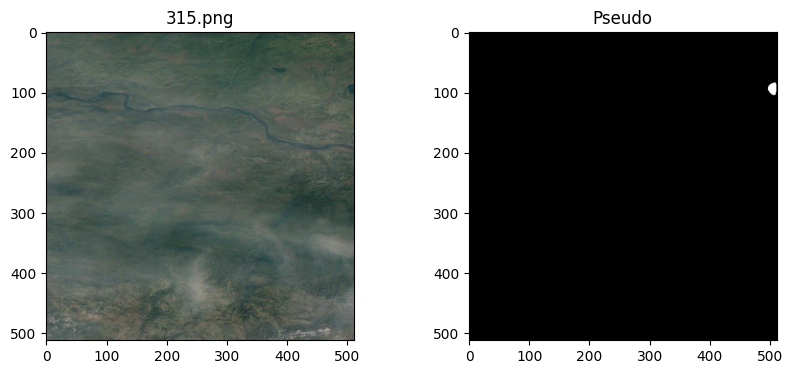

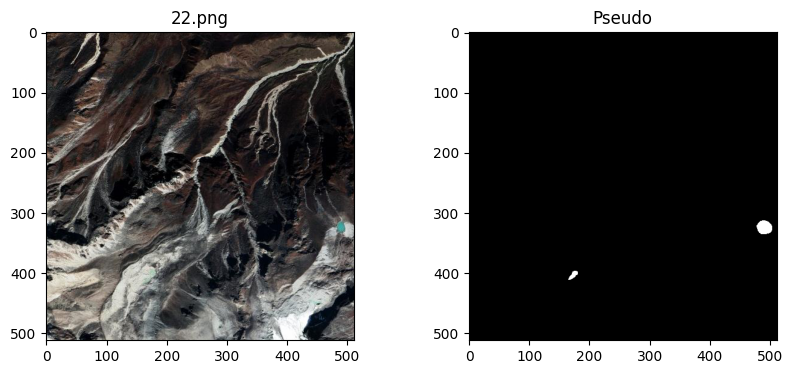

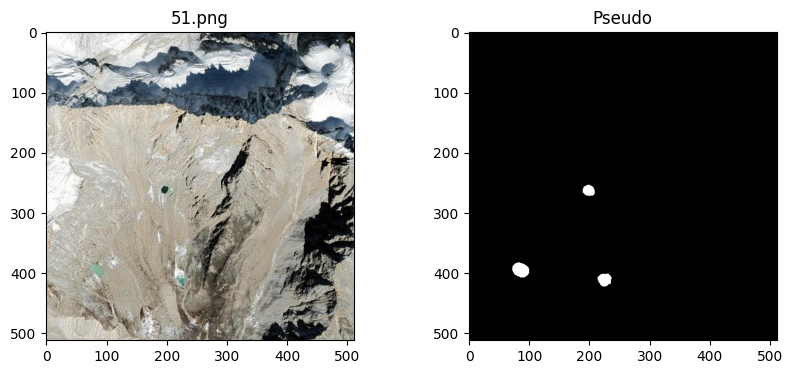

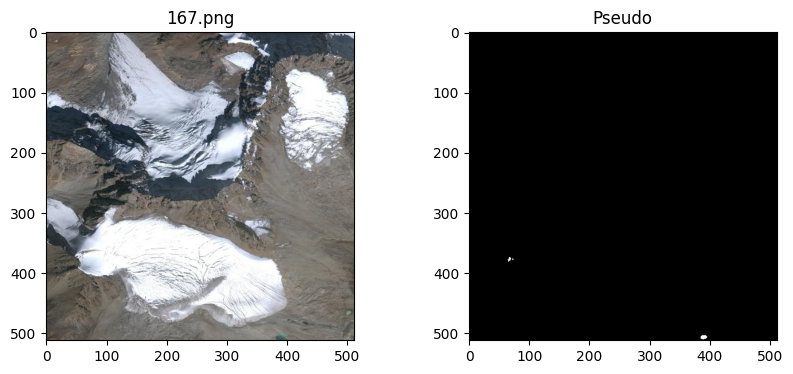

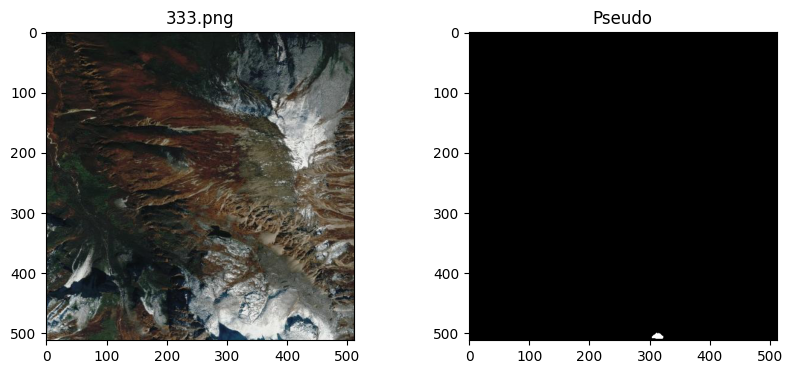

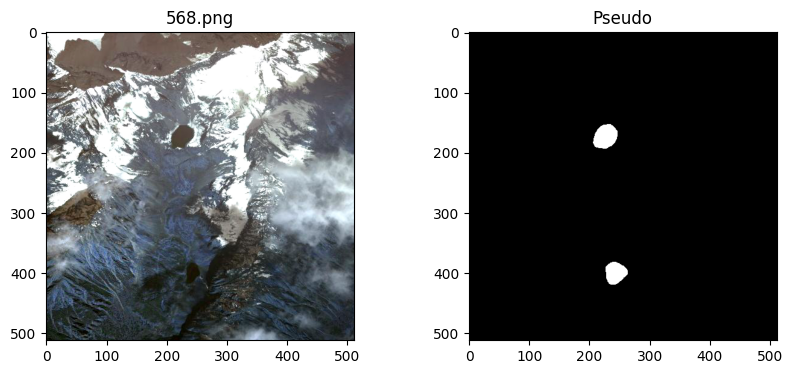

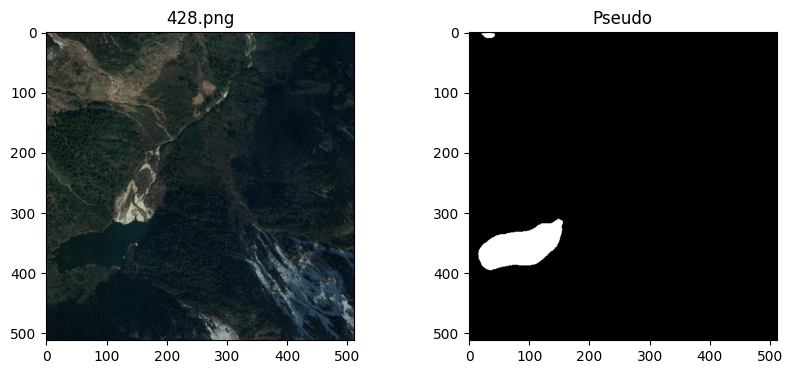

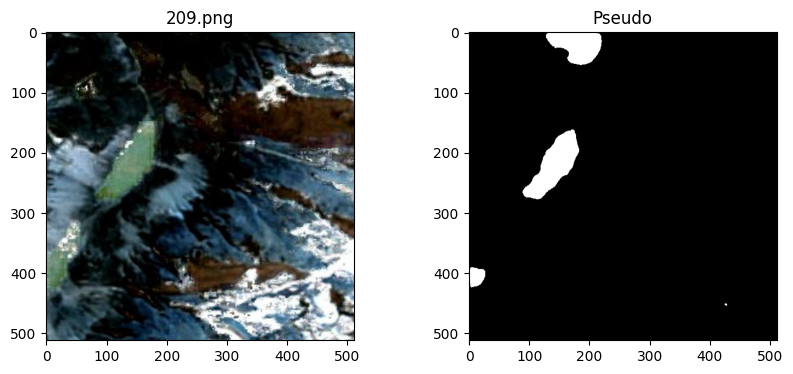

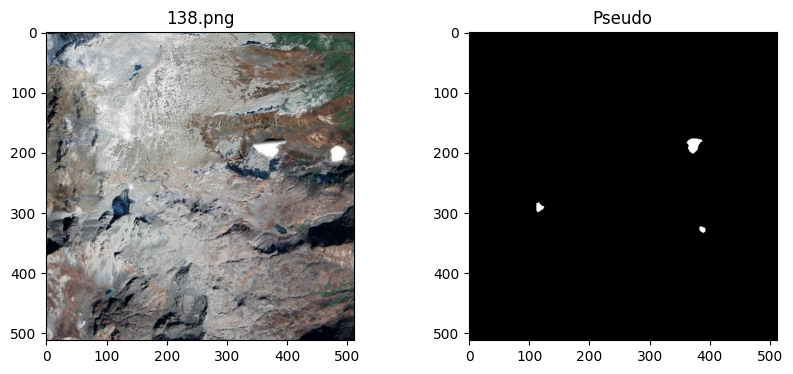

In [ ]:
import random

samples = random.sample(
    pseudo_files,
    min(10,len(pseudo_files))
)

for file in samples:

    img = cv2.imread(
        os.path.join(
            UNLABELED_ROOT,
            file
        )
    )

    img = cv2.cvtColor(
        img,
        cv2.COLOR_BGR2RGB
    )

    mask = cv2.imread(
        os.path.join(
            PSEUDO_DIR,
            file
        ),
        cv2.IMREAD_GRAYSCALE
    )

    plt.figure(figsize=(10,4))

    plt.subplot(1,2,1)
    plt.imshow(img)
    plt.title(file)

    plt.subplot(1,2,2)
    plt.imshow(mask,cmap="gray")
    plt.title("Pseudo")

    plt.show()

In [ ]:
import os

pseudo_files = os.listdir(PSEUDO_DIR)

print("Pseudo labels:", len(pseudo_files))

Pseudo labels: 499


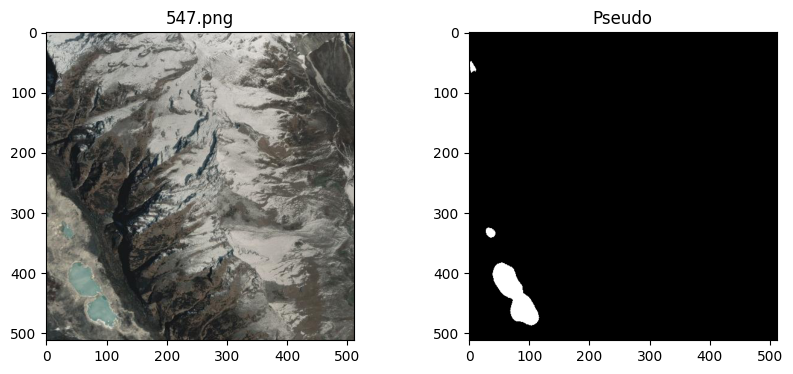

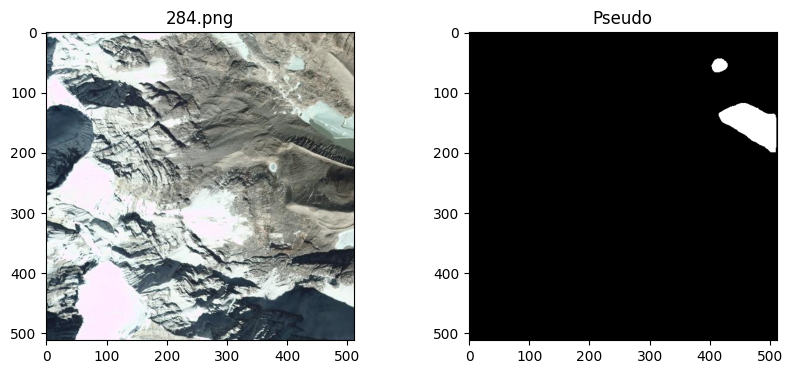

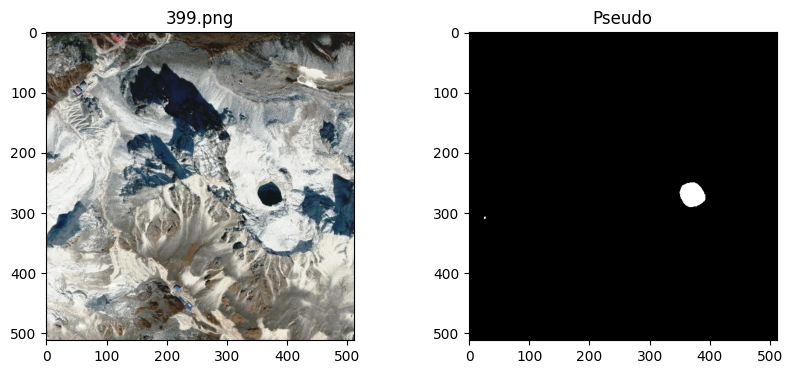

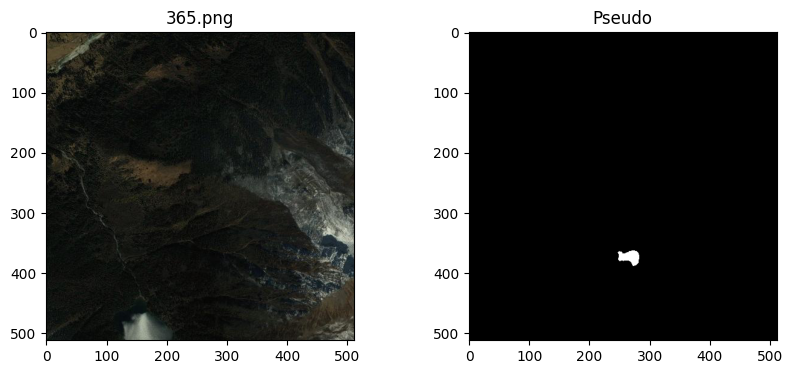

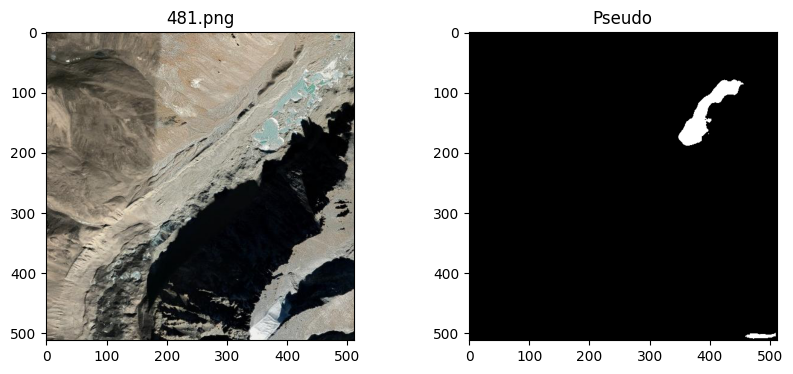

...

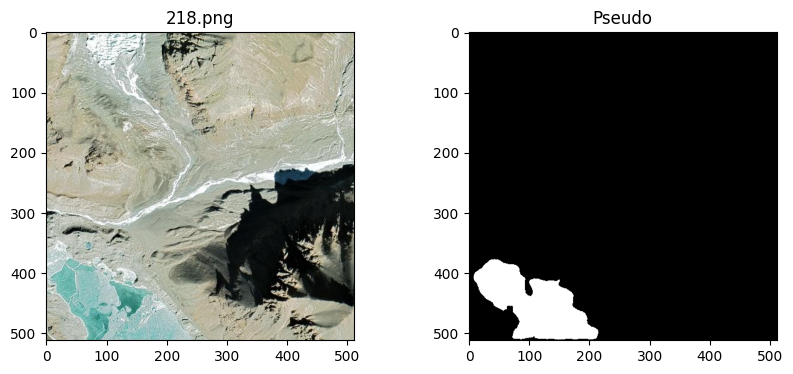

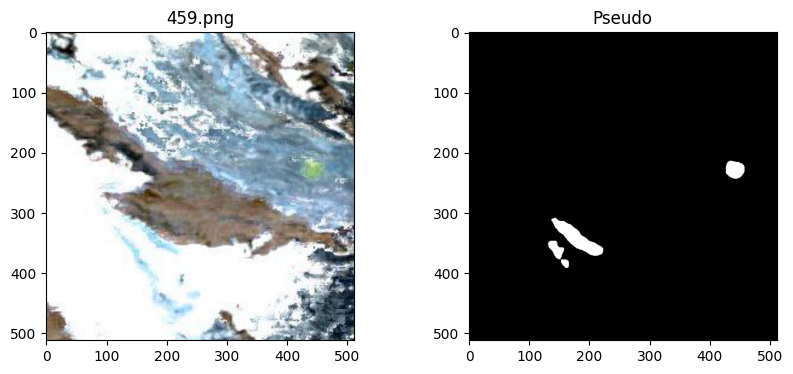

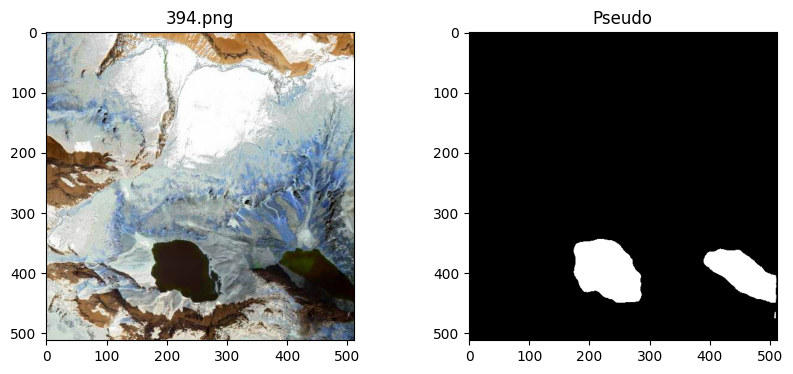

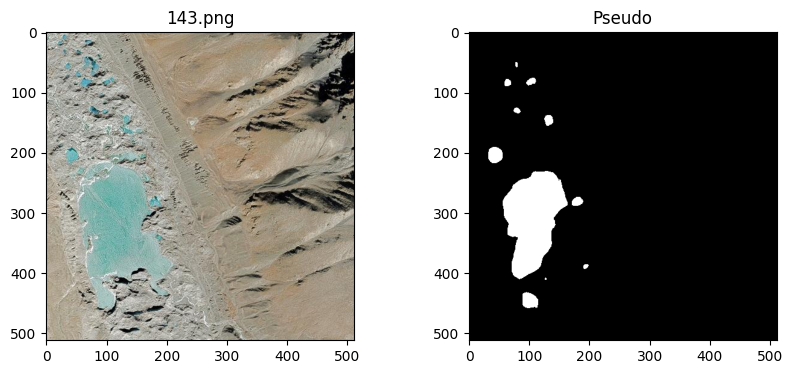

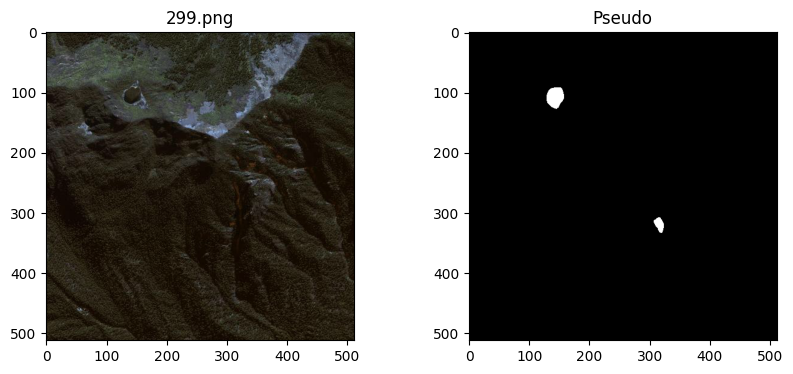

In [ ]:
import random
import matplotlib.pyplot as plt

samples = random.sample(
    pseudo_files,
    min(20, len(pseudo_files))
)

good = 0
bad = 0

for file in samples:

    img = cv2.imread(
        os.path.join(
            UNLABELED_ROOT,
            file
        )
    )

    img = cv2.cvtColor(
        img,
        cv2.COLOR_BGR2RGB
    )

    mask = cv2.imread(
        os.path.join(
            PSEUDO_DIR,
            file
        ),
        cv2.IMREAD_GRAYSCALE
    )

    plt.figure(figsize=(10,4))

    plt.subplot(1,2,1)
    plt.imshow(img)
    plt.title(file)

    plt.subplot(1,2,2)
    plt.imshow(mask,cmap="gray")
    plt.title("Pseudo")

    plt.show()

In [ ]:
real_images = train_imgs.copy()
real_masks = train_masks.copy()

pseudo_images = []
pseudo_masks = []

for file in os.listdir(PSEUDO_DIR):

    img_path = os.path.join(
        UNLABELED_ROOT,
        file
    )

    mask_path = os.path.join(
        PSEUDO_DIR,
        file
    )

    if os.path.exists(img_path):

        pseudo_images.append(
            img_path
        )

        pseudo_masks.append(
            mask_path
        )

print(
    len(real_images),
    len(pseudo_images)
)

48 499


In [ ]:
class CombinedDataset(Dataset):

    def __init__(

        self,

        real_imgs,
        real_masks,

        pseudo_imgs,
        pseudo_masks

    ):

        self.images = (
            real_imgs
            +
            pseudo_imgs
        )

        self.masks = (
            real_masks
            +
            pseudo_masks
        )

        self.real_count = len(
            real_imgs
        )

    def __len__(self):

        return len(self.images)

    def __getitem__(self, idx):

        image = cv2.imread(
            self.images[idx]
        )

        image = cv2.cvtColor(
            image,
            cv2.COLOR_BGR2RGB
        )

        mask = cv2.imread(
            self.masks[idx],
            cv2.IMREAD_GRAYSCALE
        )

        mask = (
            mask > 0
        ).astype(np.float32)

        image = (
            image.astype(np.float32)
            / 255.0
        )

        image = np.transpose(
            image,
            (2,0,1)
        )

        return (
            torch.tensor(
                image,
                dtype=torch.float32
            ),
            torch.tensor(
                mask,
                dtype=torch.float32
            ).unsqueeze(0)
        )

In [ ]:
combined_ds = CombinedDataset(

    real_images,
    real_masks,

    pseudo_images,
    pseudo_masks
)

combined_loader = DataLoader(

    combined_ds,

    batch_size=4,

    shuffle=True
)

print(
    len(combined_ds)
)

547


In [ ]:
model = smp.Unet(

    encoder_name="resnet34",

    encoder_weights="imagenet",

    in_channels=3,

    classes=1

)

model.load_state_dict(

    torch.load(
        os.path.join(
            CHECKPOINT_DIR,
            "best_unet.pth"
        )
    )
)

model = model.to(device)

In [ ]:
optimizer = torch.optim.Adam(

    model.parameters(),

    lr=1e-5
)

In [ ]:
EPOCHS = 15

for epoch in range(EPOCHS):

    model.train()

    running_loss = 0

    for images, masks in combined_loader:

        images = images.to(device)
        masks = masks.to(device)

        optimizer.zero_grad()

        outputs = model(images)

        loss = loss_fn(
            outputs,
            masks
        )

        loss.backward()

        optimizer.step()

        running_loss += loss.item()

    print(

        f"Epoch {epoch+1}",

        running_loss /
        len(combined_loader)
    )

Epoch 1 0.5565842325887541
Epoch 2 0.5268973391639055
Epoch 3 0.49387827058778194
Epoch 4 0.4819585360097189
Epoch 5 0.4607128744577839
Epoch 6 0.44833554882202703
Epoch 7 0.4145427076485905
Epoch 8 0.40685530463709446
Epoch 9 0.3805444067629584
Epoch 10 0.3718581468301968
Epoch 11 0.3405195088499654
Epoch 12 0.33480129972861633
Epoch 13 0.31357333210915544
Epoch 14 0.33333001998219175
Epoch 15 0.3037525771090584


In [ ]:
torch.save(
    model.state_dict(),
    os.path.join(
        CHECKPOINT_DIR,
        "pseudo_retrained_unet.pth"
    )
)

In [ ]:
import numpy as np
import torch

def dice_score(pred, target):

    pred = (pred > 0.5).float()

    intersection = (pred * target).sum()

    return (
        2 * intersection + 1e-6
    ) / (
        pred.sum() + target.sum() + 1e-6
    )

def iou_score(pred, target):

    pred = (pred > 0.5).float()

    intersection = (pred * target).sum()

    union = (
        pred + target
    ).clamp(0,1).sum()

    return (
        intersection + 1e-6
    ) / (
        union + 1e-6
    )

model.eval()

dice_list = []
iou_list = []

with torch.no_grad():

    for images, masks in val_loader:

        images = images.to(device)
        masks = masks.to(device)

        outputs = model(images)

        outputs = torch.sigmoid(outputs)

        dice_list.append(
            dice_score(outputs,masks).item()
        )

        iou_list.append(
            iou_score(outputs,masks).item()
        )

print("Mean Dice:", np.mean(dice_list))
print("Mean IoU :", np.mean(iou_list))

Mean Dice: 0.6139114399751028
Mean IoU : 0.48364654183387756


In [ ]:
import segmentation_models_pytorch as smp

model = smp.Unet(
    encoder_name="resnet34",
    encoder_weights="imagenet",
    in_channels=3,
    classes=1
)

model = model.to(device)

In [ ]:
model.load_state_dict(
    torch.load(
        os.path.join(
            CHECKPOINT_DIR,
            "best_unet.pth"
        ),
        map_location=device
    )
)

<All keys matched successfully>

In [ ]:
model.eval()

dice_list = []
iou_list = []

with torch.no_grad():

    for images, masks in val_loader:

        images = images.to(device)
        masks = masks.to(device)

        outputs = model(images)

        outputs = torch.sigmoid(outputs)

        dice_list.append(
            dice_score(outputs,masks).item()
        )

        iou_list.append(
            iou_score(outputs,masks).item()
        )

print("Mean Dice:", np.mean(dice_list))
print("Mean IoU :", np.mean(iou_list))

Mean Dice: 0.6314855317274729
Mean IoU : 0.5093394170204798


In [ ]:
torch.save(
    model.state_dict(),
    os.path.join(
        CHECKPOINT_DIR,
        "baseline_best_unet.pth"
    )
)

In [ ]:
import copy
import segmentation_models_pytorch as smp

student = smp.Unet(
    encoder_name="resnet34",
    encoder_weights="imagenet",
    in_channels=3,
    classes=1
).to(device)

student.load_state_dict(
    torch.load(
        os.path.join(
            CHECKPOINT_DIR,
            "best_unet.pth"
        )
    )
)

teacher = copy.deepcopy(student)

for p in teacher.parameters():
    p.requires_grad = False

optimizer = torch.optim.Adam(
    student.parameters(),
    lr=1e-5
)

print("Student and Teacher ready")

Student and Teacher ready


In [ ]:
from torch.utils.data import Dataset, DataLoader
import os
import cv2
import numpy as np
import torch

class UnlabeledDataset(Dataset):

    def __init__(self, root_dir):

        self.images = []

        for f in os.listdir(root_dir):

            if f.lower().endswith(".png"):
                self.images.append(
                    os.path.join(root_dir, f)
                )

    def __len__(self):
        return len(self.images)

    def __getitem__(self, idx):

        image = cv2.imread(self.images[idx])

        image = cv2.cvtColor(
            image,
            cv2.COLOR_BGR2RGB
        )

        image = image.astype(np.float32) / 255.0

        image = np.transpose(
            image,
            (2, 0, 1)
        )

        return torch.tensor(
            image,
            dtype=torch.float32
        )

In [ ]:
UNLABELED_DIR = "/content/drive/MyDrive/GLOC/SNUC GLOFeagles 2026 challenge datasets"

unlabeled_ds = UnlabeledDataset(
    UNLABELED_DIR
)

unlabeled_loader = DataLoader(
    unlabeled_ds,
    batch_size=4,
    shuffle=True,
    drop_last=True
)

print(len(unlabeled_ds))

575


In [ ]:
def update_ema(student, teacher, alpha=0.99):

    with torch.no_grad():

        for tp, sp in zip(
            teacher.parameters(),
            student.parameters()
        ):

            tp.data.mul_(alpha)
            tp.data.add_(
                sp.data,
                alpha=(1-alpha)
            )

In [ ]:
def bidirectional_copy_paste(
    labeled_img,
    labeled_mask,
    unlabeled_img,
    pseudo_mask
):

    lake_region = labeled_mask > 0.5

    mixed_A_img = unlabeled_img.clone()
    mixed_A_mask = pseudo_mask.clone()

    mixed_A_img[lake_region.expand_as(mixed_A_img)] = \
        labeled_img[lake_region.expand_as(labeled_img)]

    mixed_A_mask[lake_region] = \
        labeled_mask[lake_region]

    pseudo_region = pseudo_mask > 0.5

    mixed_B_img = labeled_img.clone()
    mixed_B_mask = labeled_mask.clone()

    mixed_B_img[pseudo_region.expand_as(mixed_B_img)] = \
        unlabeled_img[pseudo_region.expand_as(unlabeled_img)]

    mixed_B_mask[pseudo_region] = \
        pseudo_mask[pseudo_region]

    return (
        mixed_A_img,
        mixed_A_mask,
        mixed_B_img,
        mixed_B_mask
    )

In [ ]:
mse = nn.MSELoss()

def consistency_loss(
    student_pred,
    teacher_pred
):

    student_prob = torch.sigmoid(
        student_pred
    )

    teacher_prob = torch.sigmoid(
        teacher_pred
    )

    return mse(
        student_prob,
        teacher_prob
    )

In [ ]:
def evaluate(model):

    model.eval()

    dice_scores = []
    iou_scores = []

    with torch.no_grad():

        for images, masks in val_loader:

            images = images.to(device)
            masks = masks.to(device)

            outputs = model(images)

            outputs = torch.sigmoid(
                outputs
            )

            preds = (
                outputs > 0.5
            ).float()

            intersection = (
                preds * masks
            ).sum()

            union = (
                preds + masks
            ).clamp(0,1).sum()

            dice = (
                2*intersection + 1e-6
            ) / (
                preds.sum()
                + masks.sum()
                + 1e-6
            )

            iou = (
                intersection + 1e-6
            ) / (
                union + 1e-6
            )

            dice_scores.append(
                dice.item()
            )

            iou_scores.append(
                iou.item()
            )

    return (
        np.mean(dice_scores),
        np.mean(iou_scores)
    )

In [ ]:
student.train()

unlabeled_iter = iter(
    unlabeled_loader
)
best_dice = 0
for epoch in range(30):

    running_loss = 0

    for labeled_imgs, labeled_masks in train_loader:

        try:

            unlabeled_imgs = next(
                unlabeled_iter
            )

        except StopIteration:

            unlabeled_iter = iter(
                unlabeled_loader
            )

            unlabeled_imgs = next(
                unlabeled_iter
            )

        labeled_imgs = labeled_imgs.to(device)
        labeled_masks = labeled_masks.to(device)

        unlabeled_imgs = unlabeled_imgs.to(device)

        with torch.no_grad():

            teacher_logits = teacher(
                unlabeled_imgs
            )

            pseudo_masks = torch.sigmoid(
                teacher_logits
            )

        (
            mixA_img,
            mixA_mask,
            mixB_img,
            mixB_mask

        ) = bidirectional_copy_paste(

            labeled_imgs,
            labeled_masks,

            unlabeled_imgs,
            pseudo_masks
        )

        optimizer.zero_grad()

        sup_logits = student(
            labeled_imgs
        )

        loss_sup = loss_fn(
            sup_logits,
            labeled_masks
        )

        logits_A = student(
            mixA_img
        )

        loss_A = loss_fn(
            logits_A,
            mixA_mask
        )

        logits_B = student(
            mixB_img
        )

        loss_B = loss_fn(
            logits_B,
            mixB_mask
        )

        student_unlabeled = student(
            unlabeled_imgs
        )

        loss_cons = consistency_loss(
            student_unlabeled,
            teacher_logits
        )

        loss = (
            loss_sup
            +
            0.5 * loss_A
            +
            0.5 * loss_B
            +
            0.2 * loss_cons
        )

        loss.backward()

        optimizer.step()

        update_ema(
            student,
            teacher,
            alpha=0.99
        )

        running_loss += loss.item()

    dice, iou = evaluate(
        student
    )

    print(
        f"Epoch {epoch+1}",
        f"Loss={running_loss/len(train_loader):.4f}",
        f"Dice={dice:.4f}",
        f"IoU={iou:.4f}"
    )

    if dice > best_dice:
      best_dice = dice
      torch.save(
        student.state_dict(),
        os.path.join(
            CHECKPOINT_DIR,
            "bcp_best.pth"
            )
        )
      print(
          f"Saved at Dice={dice:.4f}"
      )

Epoch 1 Loss=1.0249 Dice=0.6193 IoU=0.4936
Saved at Dice=0.6193
Epoch 2 Loss=1.0540 Dice=0.5984 IoU=0.4548
Epoch 3 Loss=0.9443 Dice=0.6764 IoU=0.5601
Saved at Dice=0.6764
Epoch 4 Loss=0.9445 Dice=0.6783 IoU=0.5619
Saved at Dice=0.6783
Epoch 5 Loss=0.8716 Dice=0.6779 IoU=0.5633
Epoch 6 Loss=0.7964 Dice=0.6960 IoU=0.5943
Saved at Dice=0.6960
Epoch 7 Loss=0.7689 Dice=0.7095 IoU=0.5931
Saved at Dice=0.7095
Epoch 8 Loss=0.7479 Dice=0.6800 IoU=0.5671
Epoch 9 Loss=0.6494 Dice=0.6362 IoU=0.5111
Epoch 10 Loss=0.6416 Dice=0.6485 IoU=0.5208
Epoch 11 Loss=0.6056 Dice=0.7067 IoU=0.6028
Epoch 12 Loss=0.6383 Dice=0.7159 IoU=0.6026
Saved at Dice=0.7159
Epoch 13 Loss=0.5701 Dice=0.6856 IoU=0.5825
Epoch 14 Loss=0.5950 Dice=0.6373 IoU=0.5172
Epoch 15 Loss=0.5921 Dice=0.6353 IoU=0.5175
Epoch 16 Loss=0.6356 Dice=0.6919 IoU=0.5867
Epoch 17 Loss=0.7220 Dice=0.5836 IoU=0.4512
Epoch 18 Loss=0.6334 Dice=0.6143 IoU=0.4846
Epoch 19 Loss=0.5888 Dice=0.6039 IoU=0.4588
Epoch 20 Loss=0.5706 Dice=0.5613 IoU=0.4207
Epo

In [ ]:
student = smp.Unet(
    encoder_name="resnet34",
    encoder_weights=None,
    in_channels=3,
    classes=1
).to(device)

student.load_state_dict(
    torch.load(
        os.path.join(
            CHECKPOINT_DIR,
            "bcp_best.pth"
        )
    )
)

student.eval()

Unet(
  (encoder): ResNetEncoder(
    (conv1): Conv2d(3, 64, kernel_size=(7, 7), stride=(2, 2), padding=(3, 3), bias=False)
    (bn1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (relu): ReLU(inplace=True)
    (maxpool): MaxPool2d(kernel_size=3, stride=2, padding=1, dilation=1, ceil_mode=False)
    (layer1): Sequential(
      (0): BasicBlock(
        (conv1): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
        (bn1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
        (relu): ReLU(inplace=True)
        (conv2): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
        (bn2): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      )
      (1): BasicBlock(
        (conv1): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
        (bn1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track

In [9]:
import numpy as np
import torch
import os
import cv2
from sklearn.metrics import (
    precision_score, recall_score,
    f1_score, accuracy_score,
    cohen_kappa_score, jaccard_score
)
from torch.utils.data import Dataset, DataLoader
from sklearn.model_selection import train_test_split
import albumentations as A
import segmentation_models_pytorch as smp

# ── Define device ──────────────────────────────────────────────
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
print("Using device:", device)

# ── Paths and Data Loaders Setup ──────────────────────────────────────────────
# These definitions are needed for val_loader to be available.
ROOT = "/content/drive/MyDrive/GLOC"
CHECKPOINT_DIR = os.path.join(ROOT, "checkpoints")

LABEL_ROOT = os.path.join(ROOT, "Label_Subset", "Class_Labels")
MASK_ROOT = os.path.join(ROOT, "Label_Subset", "Ground truth")

classes = [
    "Cloud Cover", "Debris Cover", "Moraine",
    "Snow Cover", "Terraine Shadow", "Turbidity"
]

images = []
masks = []

for cls in classes:
    img_dir = os.path.join(LABEL_ROOT, cls)
    mask_dir = os.path.join(MASK_ROOT, cls)
    for file in os.listdir(img_dir):
        img_path = os.path.join(img_dir, file)
        mask_path = os.path.join(mask_dir, file)
        if os.path.exists(mask_path):
            images.append(img_path)
            masks.append(mask_path)

train_imgs, val_imgs, train_masks, val_masks = train_test_split(
    images,
    masks,
    test_size=0.2,
    random_state=42
)

val_transform = A.Compose([])

class LakeDataset(Dataset):
    def __init__(self, images, masks, transform=None):
        self.images = images
        self.masks = masks
        self.transform = transform
    def __len__(self):
        return len(self.images)
    def __getitem__(self, idx):
        image = cv2.imread(self.images[idx])
        image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)
        mask = cv2.imread(self.masks[idx], cv2.IMREAD_GRAYSCALE)
        mask = (mask > 0).astype(np.float32)
        if self.transform:
            transformed = self.transform(image=image, mask=mask)
            image = transformed["image"]
            mask = transformed["mask"]
        image = image.astype(np.float32) / 255.0
        image = np.transpose(image, (2,0,1))
        return (
            torch.tensor(image, dtype=torch.float32),
            torch.tensor(mask, dtype=torch.float32).unsqueeze(0)
        )

val_ds = LakeDataset(
    val_imgs,
    val_masks,
    val_transform
)

val_loader = DataLoader(
    val_ds,
    batch_size=4,
    shuffle=False
)

# ── Helper functions ───────────────────────────────────────────
# `predict_tta` is needed for the inference loop.
def predict_tta(model, images):
    # Original
    pred1 = torch.sigmoid(
        model(images)
    )
    # Horizontal Flip
    hflip = torch.flip(
        images,
        dims=[3]
    )
    pred2 = torch.sigmoid(
        model(hflip)
    )
    pred2 = torch.flip(
        pred2,
        dims=[3]
    )
    # Vertical Flip
    vflip = torch.flip(
        images,
        dims=[2]
    )
    pred3 = torch.sigmoid(
        model(vflip)
    )
    pred3 = torch.flip(
        pred3,
        dims=[2]
    )
    final_pred = (
        pred1 +
        pred2 +
        pred3
    ) / 3.0
    return final_pred

# ── Load final best model ──────────────────────────────────────
student = smp.Unet(
    encoder_name="resnet34",
    encoder_weights=None,
    in_channels=3,
    classes=1
).to(device)

student.load_state_dict(
    torch.load(
        os.path.join(CHECKPOINT_DIR, "bcp_best.pth"),
        map_location=device
    )
)
student.eval()

# ── TTA inference + per-image metrics ─────────────────────────
all_metrics = []

with torch.no_grad():
    for images, masks in val_loader:

        images = images.to(device)
        masks  = masks.cpu().numpy()          # (B, 1, H, W)

        outputs = predict_tta(student, images) # (B, 1, H, W) probs
        outputs = (outputs > 0.5).float().cpu().numpy()

        for pred, gt in zip(outputs, masks):
            pred = pred.squeeze().astype(np.uint8).flatten()
            gt   = gt.squeeze().astype(np.uint8).flatten()

            all_metrics.append({
                "IoU"      : jaccard_score(gt, pred, zero_division=0),
                "F1"       : f1_score(gt, pred, zero_division=0),
                "Precision": precision_score(gt, pred, zero_division=0),
                "Recall"   : recall_score(gt, pred, zero_division=0),
                "Accuracy" : accuracy_score(gt, pred),
                "Kappa"    : cohen_kappa_score(gt, pred)
            })

# ── Print averaged results ─────────────────────────────────────
print(f"Evaluated on {len(all_metrics)} validation images\n")
print(f"{'Metric':<12} {'Score':>8}")
print("-" * 22)
for key in all_metrics[0]:
    val = np.mean([m[key] for m in all_metrics])
    print(f"{key:<12} {val:>8.4f}")

Using device: cuda
Evaluated on 12 validation images

Metric          Score
----------------------
IoU            0.6509
F1             0.7431
Precision      0.7095
Recall         0.7993
Accuracy       0.9961
Kappa          0.7410
